# Распознавание ж/д пикетных столбиков по фотографиям с беспилотника на основе фреймворка PyTorch и предобученной модели YOLOv5

## Исходные данные

Для распознавания пикетных столбиков были собраны данные в виде 594 цветных фотографии железнодорожного полотна, сделанных с высоты 200 метров с использованием БПЛА. Разрешение каждого изображения составляет 3264x4928 пикселей в формате JPG., фото в вертикальной ориентации.

В основном на каждом фото имеется по 2 пикета, реже - один или три пикета, размер их на фото будет достаточно мал, примерно 50x50 пикселей. Расположение пикетов на фото чаще всего в средней полосе кадра, но бывают и в разных местах.

## Создание нового окружения с Python 3.10, установка PyTorch с поддержкой CUDA, установка YOLOv5 и зависимостей 

Для разработки и обучения модели распознавания пикетных столбиков необходим фреймворк PyTorch и предобученная модель YOLOv5. Окружение можно развернуть в Anaconda с использованием изолированной среды, в которой необходимо установить Python версии 3.10, эта версия выбрана для совместимости с PyTorch и YOLOv5. Помимо этого, для обучения нейронной сети на GPU необходимы пакеты CUDA Toolkit и cuDNN Library. Как скачать, установить и проверить рассказано [ЗДЕСЬ](https://www.youtube.com/watch?v=xTF_n1jp9n8).

Основные этапы настройки окружения

**1. Создание нового окружения с Python 3.10**

В Anaconda Prompt необходимо выполнить следующую команду:

```
conda create -n yolov5_env python=3.10
```
**2. Активация нового окружения**

После создания окружения его нужно активировать

```
conda activate yolov5_env
```
**3. Установка необходимых пакетов**

Установка PyTorch с поддержкой CUDA
```
pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
```

**4. Проверка установки CUDA**

После установки можно убедиться, что CUDA доступен в данном окружении:

```
python -c "import torch; print(torch.cuda.is_available())"
```

**5. Установка остальных зависимостей YOLOv5:**

Чтобы установить YOLOv5 и его зависимости, нужно перейти в папку с проектом:

```
cd D:\MyProjects\Piket_detection\
```
В эту папку клонировать репозиторий YOLOv5:

```
git clone https://github.com/ultralytics/yolov5
```

Далее перейти в папку YOLOv5:

```
cd yolov5
```

Необходимые зависимости находятся в файле requirements.txt. Для их установки:

```
pip install -r requirements.txt
```

После выполнения этих шагов YOLOv5 будет установлен. Теперь в этом окружении можно делать проект и на его основе в дальнейшем запустить обучение модели.

## Импорт библиотек

In [2]:
import os
import xml.etree.ElementTree as ET
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np
import shutil
import torch
import pandas as pd

## Подготовка и разметка данных для обучения модели

Для обучения модели YOLOv5 необходимо провести предварительную обработку данных, включающая разметку объектов, адаптацию изображений их нарезку, конвертацию и сохранение патчей.

### Labelling разметка пикетов на фото

In [2]:
## Установка labelImg
# !pip install labelImg

In [3]:
# # Запуск labelImg
# !labelImg

Запускается отдельное окно для разметки пикетов, выбираем папку со всеми фотографиями (Open Dir), далее клавишу W, выделяем область объекта, сохраняем название объекта «piket», для следующих выделенных пикетов просто выбирается имя объекта из списка.

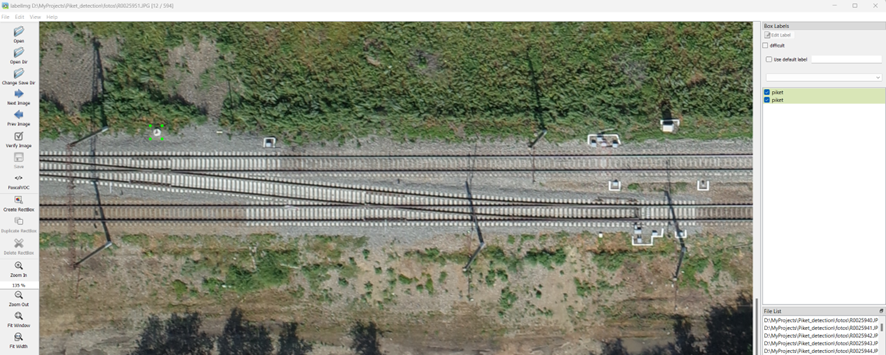

### Изменение пути в размеченных файлах

Если разметку делали сначала в одной папке, затем в другой, то этот код может изменить путь в файлах XML в нужный для всех файлов папки

In [4]:
# import os
# import xml.etree.ElementTree as ET

# # Папка с XML файлами
# xml_folder = r'D:\MyProjects\Piket_detection\pikets'
# # Новый путь к файлам изображений
# new_base_path = r'D:\MyProjects\Piket_detection\fotos'

# def update_xml_path(xml_folder, new_base_path):
#     # Перебираем все файлы в папке с .xml расширением
#     for xml_file in os.listdir(xml_folder):
#         if xml_file.endswith('.xml'):
#             xml_path = os.path.join(xml_folder, xml_file)

#             # Парсим XML файл
#             tree = ET.parse(xml_path)
#             root = tree.getroot()

#             # Ищем и обновляем элемент <path>
#             for path_element in root.iter('path'):
#                 # Имя файла из XML (filename)
#                 filename = root.find('filename').text
#                 # Обновляем путь
#                 new_path = os.path.join(new_base_path, filename)
#                 path_element.text = new_path

#                 print(f"Файл: {xml_file} обновлен с новым путем: {new_path}")

#             # Сохраняем изменения обратно в XML файл
#             tree.write(xml_path, encoding='utf-8', xml_declaration=True)

# # Запускаем функцию для обновления всех XML файлов
# update_xml_path(xml_folder, new_base_path)

### Отображение изображений с разметками

Прочитаем изображения и соответствующие XML-файлы.

In [5]:
# Путь к папкам с фотографиями и разметками
image_folder = r"D:\MyProjects\Piket_detection\fotos"
annotation_folder = r"D:\MyProjects\Piket_detection\pikets"

Выведем 2 случайных изображения с нарисованными ограничивающими рамками для пикетных столбиков.

In [6]:
# Функция для чтения координат пикетов из .xml файла
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []
    
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        boxes.append((xmin, ymin, xmax, ymax))
    
    return boxes

In [7]:
# Функция для отображения изображения с нанесенными на него пикетами
def show_image_with_boxes(image_path, boxes):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Для корректного отображения цветов
    
    for (xmin, ymin, xmax, ymax) in boxes:
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 3)  # Отрисовка красных рамок вокруг пикетов
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [8]:
# Получение списка всех изображений и соответствующих xml файлов
images = [f for f in os.listdir(image_folder) if f.endswith('.JPG')]
annotations = [f.replace('.JPG', '.xml') for f in images]

In [9]:
# Выбор 1 случайных изображения для визуализации
random_images = random.sample(images, 1)

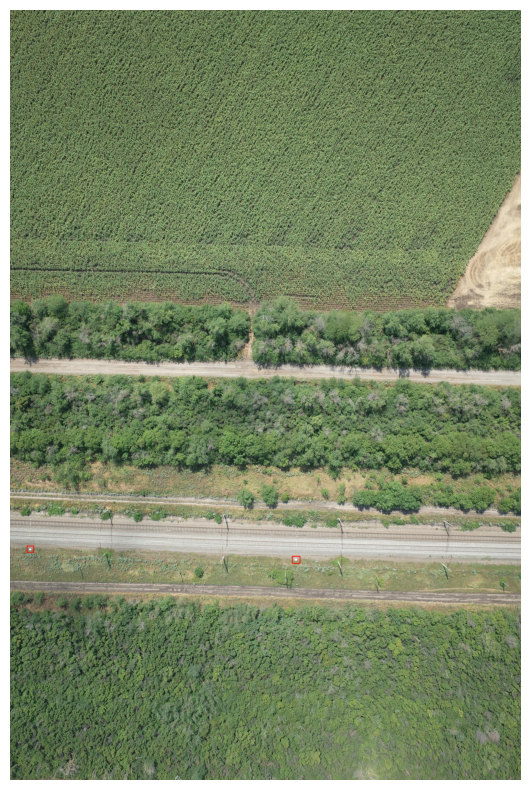

In [10]:
# Визуализация двух случайных изображений с нанесенными пикетами
for image_file in random_images:
    image_path = os.path.join(image_folder, image_file)
    annotation_path = os.path.join(annotation_folder, image_file.replace('.JPG', '.xml'))
    
    if os.path.exists(annotation_path):
        boxes = parse_annotation(annotation_path)
        show_image_with_boxes(image_path, boxes)
    else:
        print(f"Разметка для изображения {image_file} не найдена.")

### Предварительная обработка изображений

Изображения с разрешением 3264x4928 пикселей слишком большие для эффективного обучения модели, что могло привести к увеличению требований по памяти и замедлению процесса обучения. Поэтому были предприняты следующие шаги по предварительной обработке изображений:
1. Нарезка изображений: кадрирование изображений до размеров 1024x1024 пикселей с перекрытием (stride) 512 пикселей для выделения областей с пикетными столбиками, что позволяет уменьшить размер изображения без потери ключевых объектов;
2. Обновление координат bounding box: для каждого патча вычисляются новые координаты боксов (пикетов), если они попадают в область патча.
3. Сохранение патчей: сохраняются только те патчи, в которых есть пикеты, вместе с их разметкой в формате YOLOv5 (координаты центров и размеры боксов). 

In [11]:
# Параметры нарезки
patch_size = 1024
stride = 512  # Шаг нарезки

In [12]:
# Функция для нарезки изображения на патчи
def slice_image(image, patch_size, stride):
    patches = []
    h, w, _ = image.shape
    for y in range(0, h - patch_size + 1, stride):
        for x in range(0, w - patch_size + 1, stride):
            patch = image[y:y + patch_size, x:x + patch_size]
            patches.append((patch, x, y))
    return patches

In [13]:
# Функция для обновления координат боксов для патча
def update_boxes_for_patch(boxes, x_offset, y_offset, patch_size):
    updated_boxes = []
    for (xmin, ymin, xmax, ymax) in boxes:
        # Переводим координаты бокса в систему координат патча
        xmin_patch = xmin - x_offset
        ymin_patch = ymin - y_offset
        xmax_patch = xmax - x_offset
        ymax_patch = ymax - y_offset
        
        # Проверяем, попадает ли бокс в границы патча
        if (0 <= xmin_patch <= patch_size and 0 <= ymin_patch <= patch_size and 
            0 <= xmax_patch <= patch_size and 0 <= ymax_patch <= patch_size):
            updated_boxes.append((xmin_patch, ymin_patch, xmax_patch, ymax_patch))
    
    return updated_boxes

In [14]:
# Функция для сохранения патчей и обновленной разметки
def save_patches(image_file, boxes, save_dir):
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    patches = slice_image(image, patch_size, stride)
    
    for i, (patch, x_offset, y_offset) in enumerate(patches):
        patch_boxes = update_boxes_for_patch(boxes, x_offset, y_offset, patch_size)
        
        if len(patch_boxes) > 0:  # Сохраняем только патчи с пикетами
            patch_name = f"{image_file.replace('.JPG', '')}_patch_{i}.jpg"
            patch_path = os.path.join(save_dir, patch_name)
            cv2.imwrite(patch_path, cv2.cvtColor(patch, cv2.COLOR_RGB2BGR))
            
            # Также нужно сохранить соответствующую разметку для каждого патча (если пикеты в нём есть)
            annotation_file = patch_path.replace('.jpg', '.txt')  # Используем .txt для YOLOv5 формата
            with open(annotation_file, 'w') as f:
                for (xmin, ymin, xmax, ymax) in patch_boxes:
                    # Преобразование координат в формат YOLO (x_center, y_center, width, height)
                    x_center = (xmin + xmax) / 2 / patch_size
                    y_center = (ymin + ymax) / 2 / patch_size
                    width = (xmax - xmin) / patch_size
                    height = (ymax - ymin) / patch_size
                    f.write(f"0 {x_center} {y_center} {width} {height}\n")  # '0' - класс пикет           

In [15]:
# Папка для сохранения нарезанных изображений и разметок
save_dir = r"D:\MyProjects\Piket_detection\sliced_images"
os.makedirs(save_dir, exist_ok=True)

In [16]:
# Запускаем процесс нарезки всех изображений и сохранения патчей
for image_file in images:
    annotation_file = os.path.join(annotation_folder, image_file.replace('.JPG', '.xml'))
    
    if os.path.exists(annotation_file):
        boxes = parse_annotation(annotation_file)
        save_patches(image_file, boxes, save_dir)
    else:
        print(f"Разметка для изображения {image_file} не найдена.")

### Проверка правильности нарезки

Визуализировать правильность нарезки фотографий, сопоставление с ними аннотаций можно так:

1. Чтение аннотаций: аннотации загружаются из файлов формата YOLOv5 и преобразуются в стандартные координаты (xmin, ymin, xmax, ymax).
2. Отображение изображений: для каждого изображения рисуются bounding box вокруг пикетов, если такие есть.
3. Визуализация: три случайных изображения из папки sliced_images визуализируются с нанесенными на них bounding box.

In [17]:
# Путь к папке с нарезанными изображениями и аннотациями
sliced_image_folder = r"D:\MyProjects\Piket_detection\sliced_images"

In [18]:
# Функция для чтения аннотаций в формате YOLOv5
def read_yolo_annotation(annotation_file, img_size):
    boxes = []
    with open(annotation_file, 'r') as f:
        lines = f.readlines()
        for line in lines:
            _, x_center, y_center, width, height = map(float, line.strip().split())
            # Преобразование координат из YOLOv5 в обычные координаты (xmin, ymin, xmax, ymax)
            x_center *= img_size
            y_center *= img_size
            width *= img_size
            height *= img_size
            xmin = int(x_center - width / 2)
            ymin = int(y_center - height / 2)
            xmax = int(x_center + width / 2)
            ymax = int(y_center + height / 2)
            boxes.append((xmin, ymin, xmax, ymax))
    return boxes

In [19]:
# Функция для отображения изображения с нанесенными на него пикетами
def show_sliced_image_with_boxes(image_path, annotation_path, img_size=1024):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Для корректного отображения цветов
    
    if os.path.exists(annotation_path):
        boxes = read_yolo_annotation(annotation_path, img_size)
        for (xmin, ymin, xmax, ymax) in boxes:
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)  # Отрисовка красных рамок вокруг пикетов
    
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [21]:
# Получаем список всех нарезанных изображений
sliced_images = [f for f in os.listdir(sliced_image_folder) if f.endswith('.jpg')]
random_images = random.sample(sliced_images, 1)

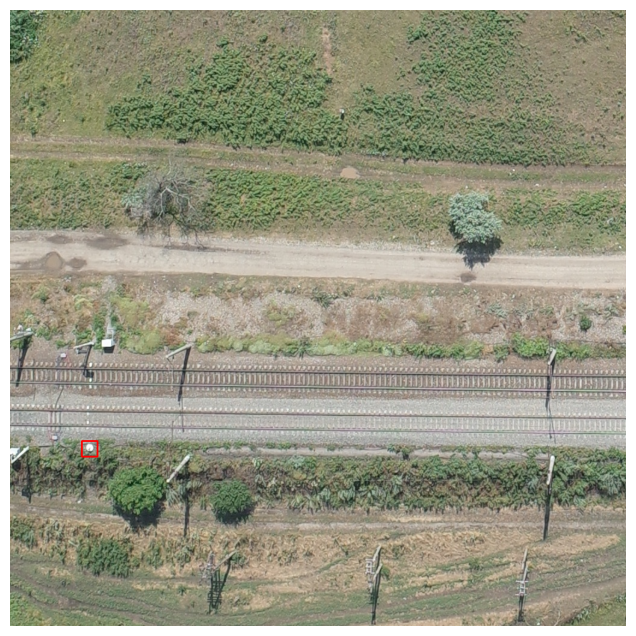

In [22]:
# Визуализация 1 случайных изображений с нанесенными пикетами
for image_file in random_images:
    image_path = os.path.join(sliced_image_folder, image_file)
    annotation_path = image_path.replace('.jpg', '.txt')  # Путь к файлу аннотаций
    show_sliced_image_with_boxes(image_path, annotation_path)

### Создание обучающей и тестовой выборок

После подготовки данных изображения были случайным образом разделены на две части: обучающую (80%) и тестовую (20%) выборки. Каждое изображение из выборок имело соответствующую аннотацию в формате YOLOv5. Папки с обучающей и тестовой выборками были структурированы в соответствии с требованиями фреймворка YOLOv5.

In [23]:
# Создание папок для обучающей и тестовой выборок
train_folder = r"D:\MyProjects\Piket_detection\train_data"
val_folder = r"D:\MyProjects\Piket_detection\val_data"

os.makedirs(train_folder, exist_ok=True)
os.makedirs(val_folder, exist_ok=True)

In [24]:
# Получение списка всех нарезанных изображений
sliced_images = [f for f in os.listdir(sliced_image_folder) if f.endswith('.jpg')]

In [25]:
# Процент для обучающей 80% и тестовой выборки 20%
train_ratio = 0.8

In [26]:
# Перемешивание данных случайным образом
random.shuffle(sliced_images)

In [27]:
# Разделение на обучающую и тестовую выборки
train_size = int(len(sliced_images) * train_ratio)
train_images = sliced_images[:train_size]
val_images = sliced_images[train_size:]

In [28]:
# Функция для копирования изображений и аннотаций
def copy_files(image_list, source_folder, dest_folder):
    for image_file in image_list:
        # Путь к изображению и аннотации
        image_path = os.path.join(source_folder, image_file)
        annotation_path = image_path.replace('.jpg', '.txt')

        # Убедимся, что копируем файлы в разные папки
        if not os.path.exists(os.path.join(dest_folder, image_file)):
            # Копируем изображение
            shutil.copy(image_path, os.path.join(dest_folder, image_file))

        # Копируем аннотацию, если она существует и не копируется в ту же папку
        if os.path.exists(annotation_path):
            dest_annotation_path = os.path.join(dest_folder, os.path.basename(annotation_path))
            if not os.path.exists(dest_annotation_path):
                shutil.copy(annotation_path, dest_annotation_path)

In [29]:
# Копируем обучающую выборку
copy_files(train_images, sliced_image_folder, train_folder)
print(f"Обучающая выборка: {len(train_images)} изображений")

Обучающая выборка: 2556 изображений


In [30]:
# Копируем тестовую выборку
copy_files(val_images, sliced_image_folder, val_folder)
print(f"Тестовая выборка: {len(val_images)} изображений")

Тестовая выборка: 639 изображений


In [31]:
# Функция для чтения аннотации и вывода изображения с bounding box'ами
def plot_image_with_pikets(image_path, annotation_path):
    # Чтение изображения
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Чтение аннотации
    with open(annotation_path, 'r') as file:
        lines = file.readlines()
    
    # Пробегаем по всем аннотациям и рисуем bounding box'ы
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        img_h, img_w, _ = img.shape
        
        # Преобразование относительных координат в пиксели
        x_center, y_center = int(x_center * img_w), int(y_center * img_h)
        width, height = int(width * img_w), int(height * img_h)
        
        # Вычисляем координаты верхнего левого и нижнего правого углов
        xmin = int(x_center - width / 2)
        ymin = int(y_center - height / 2)
        xmax = int(x_center + width / 2)
        ymax = int(y_center + height / 2)
        
        # Рисуем bounding box
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
    
    # Вывод изображения
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [32]:
# Функция для вывода случайного изображения из указанной папки с наложением bounding box
def plot_random_images_with_pikets(folder, num_images=2):
    image_files = [f for f in os.listdir(folder) if f.endswith('.jpg')]
    
    # Выбираем случайные изображения
    random_images = random.sample(image_files, num_images)
    
    for image_file in random_images:
        # Путь к изображению
        image_path = os.path.join(folder, image_file)
        
        # Путь к аннотации
        annotation_path = image_path.replace('.jpg', '.txt')
        
        # Используем ранее написанную функцию для отображения изображений
        if os.path.exists(annotation_path):
            plot_image_with_pikets(image_path, annotation_path)
        else:
            print(f"Аннотация для {image_file} не найдена.")

Случайные изображения из обучающей выборки:


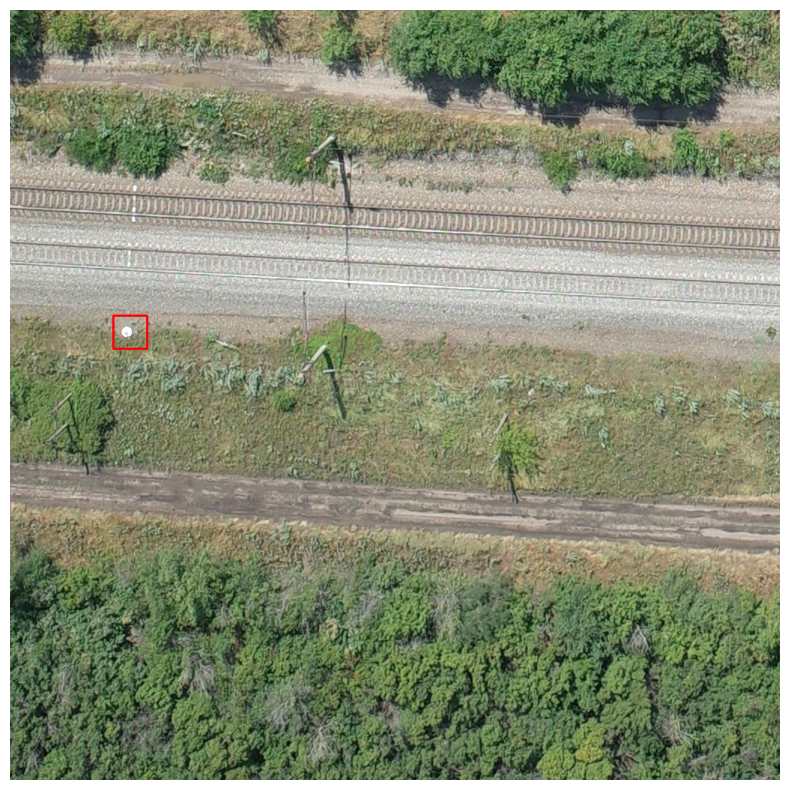

Случайные изображения из тестовой выборки:


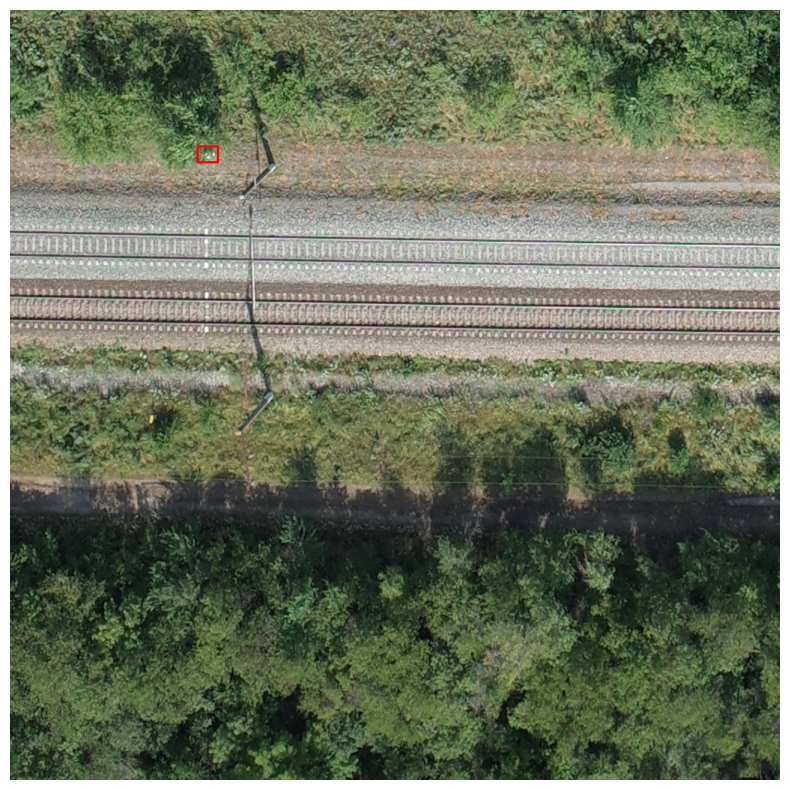

In [33]:
# Вывод 1 случайного изображения из обучающей выборки
print("Случайные изображения из обучающей выборки:")
plot_random_images_with_pikets(train_folder, num_images=1)

# Вывод одного случайного изображения из тестовой выборки
print("Случайные изображения из тестовой выборки:")
plot_random_images_with_pikets(val_folder, num_images=1)

## Обучение модели

### Подготовка файла конфигурации

Перед тем, как запустить обучение модели YOLOv5 необходимо создать файл data.yaml, содержащий пути к обучающей и тестовой выборкам, а также информацию о количестве классов (в нашем случае – один класс "piket").

Пример файла data.yaml:
```
train: D:/MyProjects/Piket_detection/train_data  # Путь к папке с обучающими изображениями
val: D:/MyProjects/Piket_detection/val_data      # Путь к папке с валидационными изображениями

nc: 1  # Количество классов (у нас один класс — пикет)
names: ['piket']  # Название класса

```


### Активация окружения, установка зависимостей

После подготовки файла конфигурации, следующим шагом - обучение модели YOLOv5 для распознавания пикетных столбиков.
Процедура запуска обучения модели на GPU (видеокарте) осуществляется через командную строку в созданном ранее окружении:
```
conda activate yolov5_env
```
Переходим в папку со скаченным репозиторием:
```
cd D:\MyProjects\Piket_detection\yolov5
```
Устанавливаем зависимости:
```
pip install -r requirements.txt
```
Проверяем, доступна ли видеокарта для обучения (по результату True/False), в противном случае обучать на CPU, а это в десятки раз (а то и сотни) медленнее:
```
python -c "import torch; print(torch.cuda.is_available())"
```

### Запуск обучения

Теперь можно запустить обучение:
```
python train.py --img 1024 --batch 8 --epochs 15 --data D:/MyProjects/Piket_detection/data.yaml --weights yolov5s.pt --name MY_MODEL --device 0
```

### Запуск обучения модели YOLOv5

Параметры обучения:

--img 1024: задает размер входного изображения для модели. Здесь размер установлен на 1024 пикселя, что соответствует разрешению нарезанных изображений. Этот параметр важен, так как модели YOLO требуется фиксированный размер изображения для работы, а более крупное разрешение позволяет точнее распознавать мелкие детали на картинке, такие как пикетные столбики.

--batch 8: размер батча, то есть количество изображений, обрабатываемых моделью за один шаг обучения. В данном случае он установлен на 8. Размер батча влияет на стабильность и скорость обучения, а также на использование видеопамяти (GPU memory). Если ресурсов недостаточно, иногда его уменьшают, чтобы избежать переполнения памяти.

--epochs 15: количество эпох обучения. Количество часто подбирается эмпирически: малое количество может привести к недообучению, а слишком большое — к переобучению.

--data D:/MyProjects/Piket_detection/data.yaml: путь к файлу конфигурации данных (data.yaml). Этот YAML-файл содержит информацию о путях к тренировочной и валидационной выборкам, а также о классах, которые должна распознавать модель. Его наличие позволяет модели знать, с какими данными она работает и какие классы объектов искать.

--weights yolov5s.pt: путь к файлу с предобученными весами. Здесь используется yolov5s.pt, который является легковесной версией модели YOLOv5. Предобученные веса служат базой для дообучения, ускоряя обучение и улучшая точность, поскольку модель уже имеет общее представление о типах объектов, и ей нужно адаптироваться только к специфике пикетных столбиков.

--name MY_MODEL: задает имя для сессии обучения. Результаты обучения (включая веса и логи) будут сохранены в папке с этим именем, что облегчает организацию и последующее использование файлов, особенно если проводится несколько экспериментов.

--device 0: указывает, на каком устройстве будет выполняться обучение. Здесь 0 означает использование первого доступного GPU. Это помогает ускорить процесс, так как обучение модели на GPU значительно быстрее, чем на CPU. Параметр «--device cpu» запустит обучение на ЦП. 


In [ ]:
# python train.py --img 1024 --batch 8 --epochs 15 --data D:/MyProjects/Piket_detection/data.yaml --weights yolov5s.pt --name MY_MODEL --device 0

## Результаты обучения модели

На предоставленных графиках можно проанализировать результаты обучения модели YOLOv5 для детекции пикетов.

После завершения обучения модели, результаты будут сохранены в папке yolov5\runs\train\ в нашем случае путь выглядит так:
```
D:\MyProjects\Piket_detection\yolov5\runs\train\MY_MODEL
```

### Файл results

In [34]:
# Путь к файлу с результатами
result_file_path = r"D:\MyProjects\Piket_detection\yolov5\runs\train\MY_MODEL3\results.csv"

# Чтение CSV-файла
res = pd.read_csv(result_file_path)

# Округление всех числовых значений до трех знаков после запятой
res = res.round(3)

In [35]:
res

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.085,0.026,0,0.011,0.991,0.478,0.156,0.056,0.012,0,0.070,0.003,0.003
1,1,0.057,0.013,0,0.710,0.855,0.757,0.299,0.047,0.008,0,0.040,0.006,0.006
2,2,0.053,0.010,0,0.622,0.645,0.594,0.198,0.050,0.007,0,0.009,0.009,0.009
3,3,0.049,0.008,0,0.907,0.917,0.921,0.449,0.037,0.006,0,0.008,0.008,0.008
4,4,0.044,0.007,0,0.899,0.924,0.930,0.475,0.036,0.005,0,0.008,0.008,0.008
5,5,0.041,0.006,0,0.935,0.928,0.943,0.465,0.037,0.005,0,0.007,0.007,0.007
6,6,0.039,0.006,0,0.937,0.944,0.963,0.491,0.033,0.005,0,0.007,0.007,0.007
7,7,0.038,0.006,0,0.958,0.955,0.967,0.505,0.034,0.005,0,0.006,0.006,0.006
8,8,0.036,0.006,0,0.953,0.961,0.970,0.505,0.035,0.004,0,0.005,0.005,0.005
9,9,0.034,0.005,0,0.960,0.958,0.980,0.543,0.031,0.004,0,0.005,0.005,0.005


In [36]:
# сохранение таблицы в файл
save_path = r"D:\MyProjects\Piket_detection\res.xlsx"
res.to_excel(save_path, index=True)

Статичное изображение таблицы

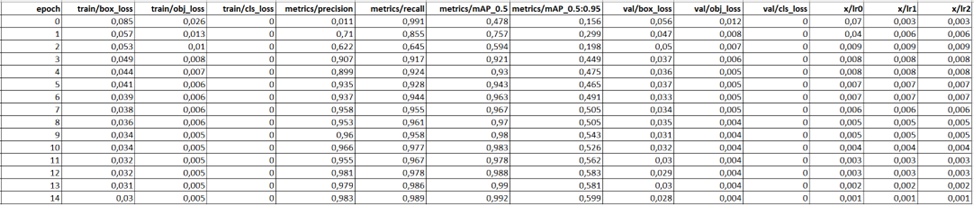

Результаты обучения модели

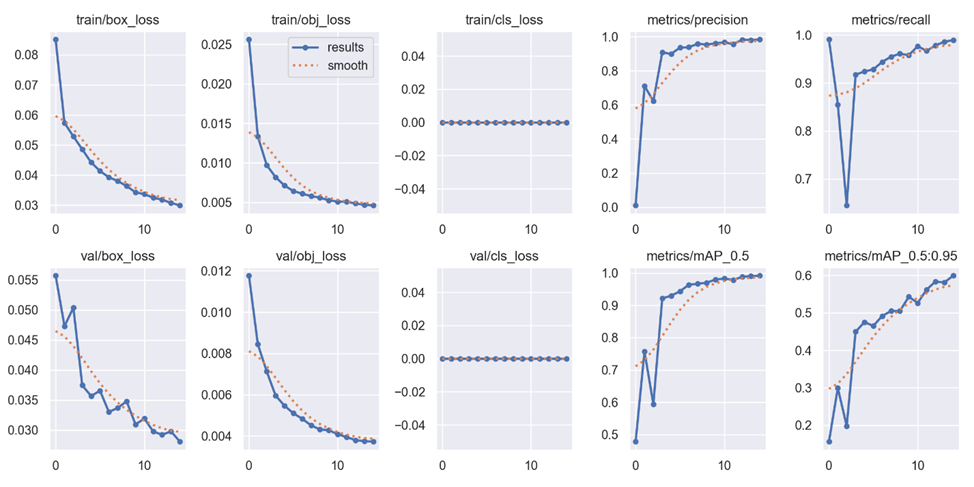

- train/box_loss и val/box_loss: показатели ошибок (loss) на обучающем и валидационном наборах. Обе кривые показывают, что ошибки (loss) уменьшаются по мере обучения, что указывает на то, что модель становится лучше в нахождении bounding boxes. Валидационная ошибка (val/box_loss) немного колеблется в начале, но в конце она стабилизируется, что хорошо.
- train/obj_loss и val/obj_loss: ошибки объектной функции, которые измеряют уверенность модели в наличии объектов в кадре. Видно, что эти ошибки также уменьшаются, что подтверждает улучшение в уверенности модели.
- train/cls_loss и val/cls_loss: ошибки классификации (cls_loss) равны нулю. Это может быть связано с тем, что в данном случае только один класс для детекции — "piket", что исключает необходимость в многоклассовой классификации.
- metrics/precision и metrics/recall: метрики точности (precision) и полноты (recall) увеличиваются и достигают высоких значений ближе к завершению обучения, что говорит о том, что модель успешно находит и классифицирует пикеты.
- metrics/mAP_0.5 и metrics/mAP_0.5:0.95: метрики средней точности (Mean Average Precision) на разных уровнях IoU (intersection over union). Видно, что mAP на уровне 0.5 достаточно высок (около 0.9), а при более строгом mAP 0.5:0.95 также увеличивается до ~0.6. Это хороший результат, показывающий, что модель точно детектирует пикеты.

Модель хорошо обучена и показывает стабильные результаты на обучающей и валидационной выборках.

Метрики mAP показывают, что модель имеет достаточно высокую точность в детекции пикетов, хотя есть возможности для дальнейшего улучшения на более строгих уровнях IoU.


### Файл F1_curve

График F1-Confidence Curve показывает соотношение между метрикой F1 и уверенностью модели. Видно, что при уровне уверенности около 0.6 модель демонстрирует наилучшее значение F1 (приблизительно 0.99). Это говорит о том, что модель эффективно сбалансировала precision и recall, если порог доверия установлен на 0.6.

Для дальнейшего использования модели можно рассмотреть установление порога уверенности около 0.6, что максимизирует баланс между precision и recall.

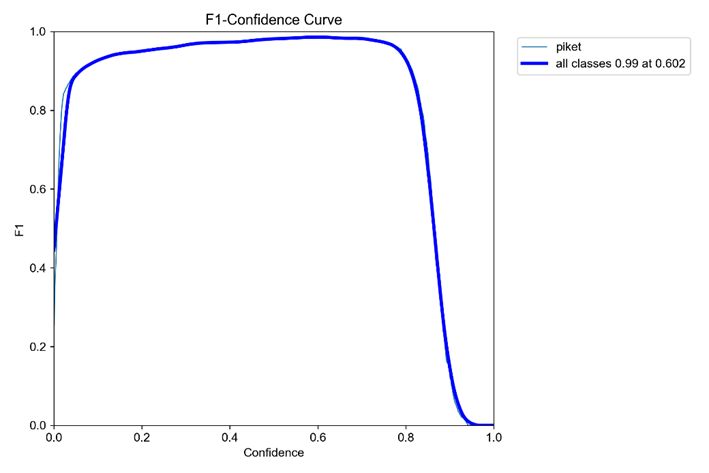

### Файл P_curve

График Precision-Confidence показывает, как изменяется точность при различных уровнях уверенности. График демонстрирует высокую точность, достигающую максимума около уровня уверенности 0.89.

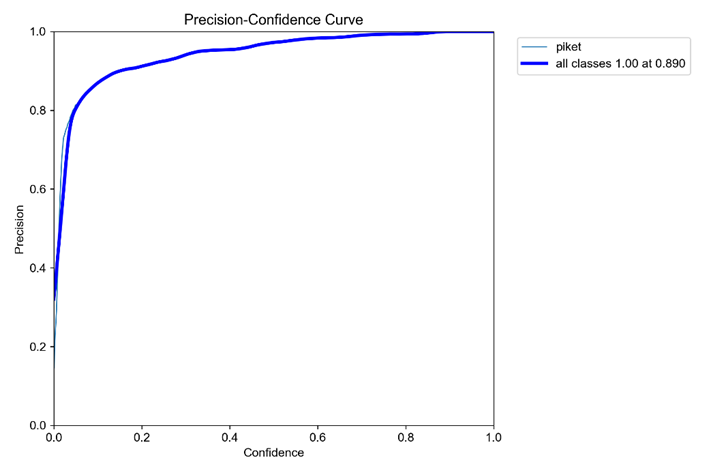

### Файл R_curve

График Recall-Confidence иллюстрирует, как изменяется полнота модели в зависимости от уровня уверенности. Полнота держится на уровне около 1.0 до уровня уверенности примерно 0.8, что указывает на уверенное обнаружение большинства объектов при высоких значениях уверенности.

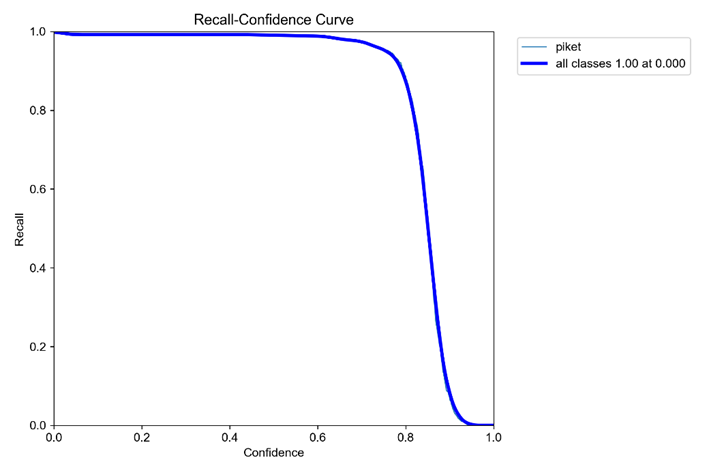

### Файл PR_curve

График Precision-Recall демонстрирует соотношение между точностью и полнотой для модели, показывая высокие значения обеих метрик (примерно 0.992), что свидетельствует об очень хорошей способности модели к распознаванию пикетов.

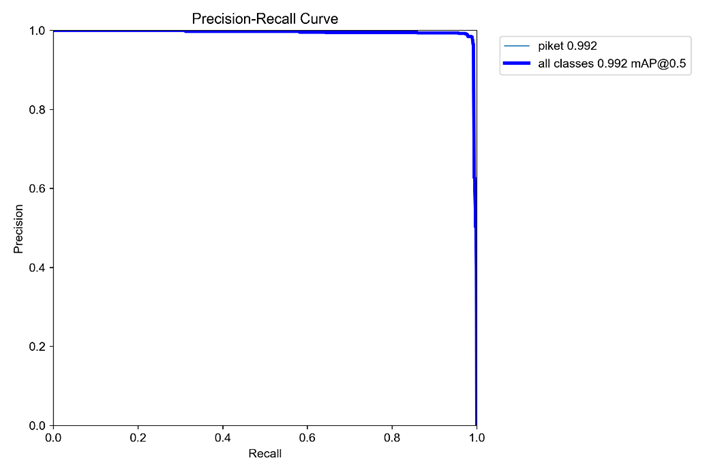

**Вывод по графикам F1_curve, P_curve , R_curve, PR_curve:**

По представленным метрикам, модель показывает отличные результаты, достигая высокого уровня точности и полноты, что может говорить об успешном обучении и хорошей способности к детекции пикетов на изображениях.

### Файл confusion_matrix

На изображении с матрицей ошибок (Confusion Matrix) видно, что модель показывает высокий уровень точности, с правильным распознаванием всех пикетов. Это говорит о том, что модель хорошо справляется с задачей классификации и минимизирует количество ложных срабатываний и пропусков.

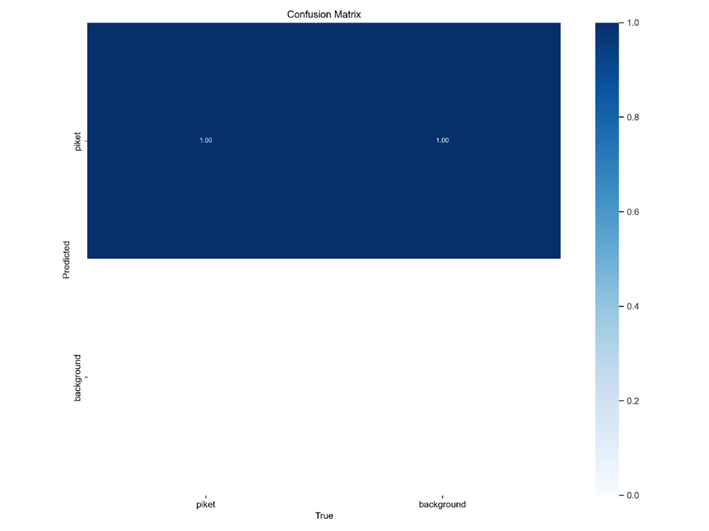

### Файл labels

Гистограмма меток (labels.jpg) показывает, что все изображения относятся к классу "пикет". Также можно увидеть распределения меток по осям x, y, ширине и высоте объектов. Это позволяет оценить характер распределения пикетов на изображениях и их размеры.

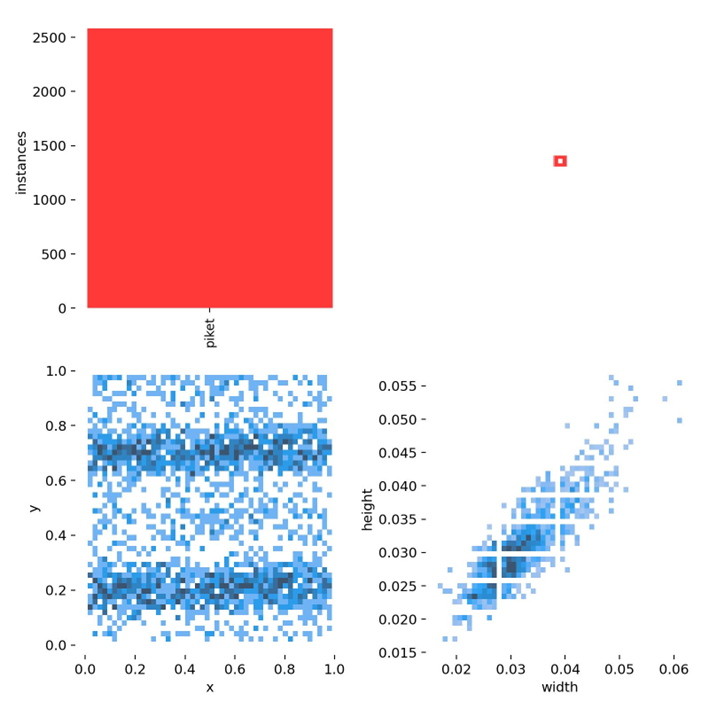

### Файл labels_correlogram

На изображении «Correlogram меток» представлена корреляционная диаграмма для меток (labels_correlogram.jpg). Здесь видны распределения координат (x, y) и размеров (width, height) объектов на изображениях. Существует явная корреляция между width и height, что говорит о том, что пикеты имеют пропорциональную форму. В координатах x и y также можно заметить ряды, что может свидетельствовать о регулярной сетке расположения пикетов на изображениях.

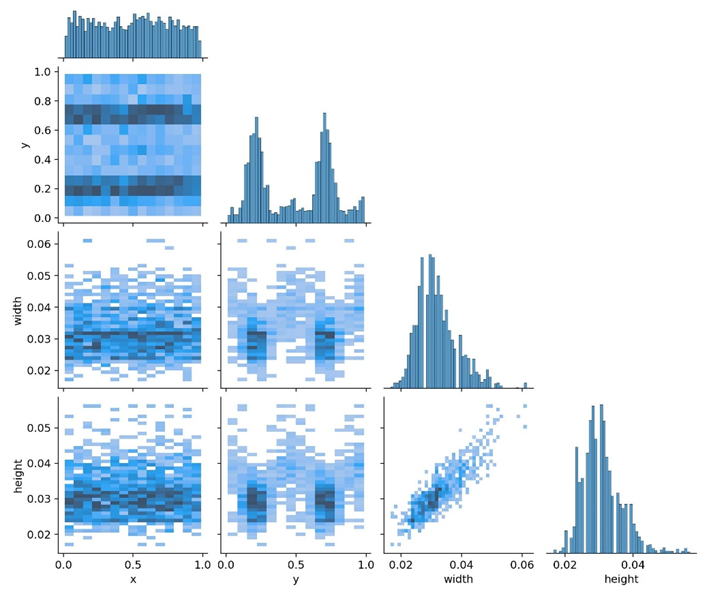

### Пример батчей обучающей выборки

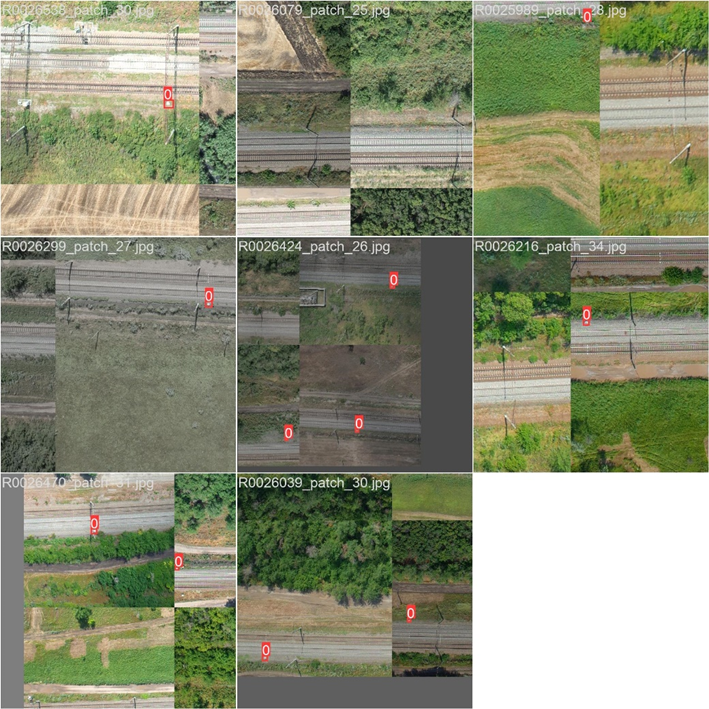

### Примеры батчей валидационной выборки

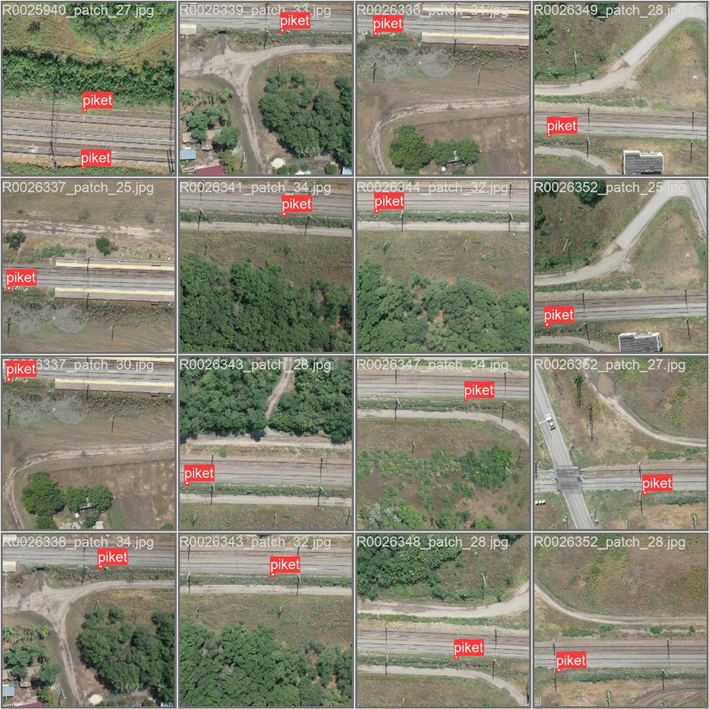

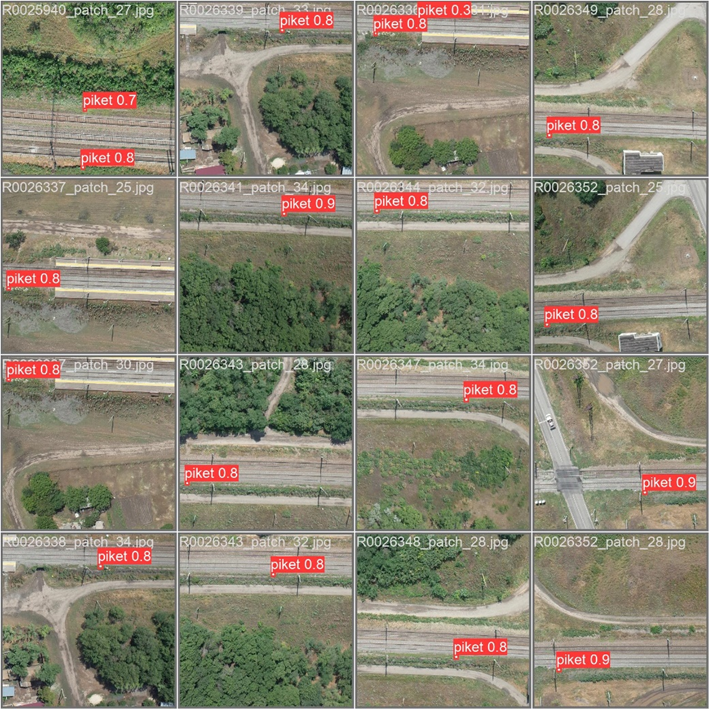

### Общий вывод по результатам обучения модели YOLO для распознавания пикетов:

На основе представленных изображений можно сделать следующие выводы:

1. Распределение меток и параметров объектов:
Гистограммы и корреляционная диаграмма меток показывают, что пикеты на изображениях распределены достаточно регулярно и имеют стабильные размеры. Это подтверждается корреляцией между шириной и высотой объектов, что указывает на их однородную форму и размер. Координаты объектов по x и y также распределены относительно равномерно, с периодическими всплесками, что может свидетельствовать о регулярном расположении пикетов на изображениях.

2. Классовый дисбаланс:
На гистограмме видно, что все объекты на изображениях относятся к одному классу – "piket". Это упрощает задачу для модели, так как отсутствует необходимость различать между разными объектами. Однако это также делает модель менее гибкой в плане распознавания других классов объектов в будущем.

3. Качество классификации:
Матрица ошибок (confusion matrix) указывает на высокую точность модели. Все пикеты распознаны правильно, и отсутствуют ошибки классификации. Это говорит о том, что модель успешно научилась распознавать пикеты и минимизирует как ложные срабатывания, так и пропуски.

**Заключение по результатам обучения:**
Модель YOLO показывает отличные результаты в задаче распознавания пикетов, демонстрируя высокую точность и хорошую обобщающую способность на предоставленном наборе данных. Учитывая отсутствие ошибок классификации и регулярное распределение меток, можно предположить, что модель готова к использованию на новых изображениях с аналогичными условиями.
Возможно, для проверки устойчивости модели стоило бы протестировать её на других изображениях с пикетами, снятыми под разными углами или при изменении высоты съёмки. В целом, модель YOLO успешно справилась с поставленной задачей на текущих данных.


# Применение модели для распознавания на новых данных

Теперь готовую обученную модель можно применить (протестировать) для распознавания пикетов на новых изображениях, которые модель ранее не «видела» ни на обучающем, ни на валидационном наборе данных.
Ниже код, который выполняет задачу детекции объектов (пикетов) на изображении с использованием обученной модели YOLOv5, состоящий из основных шагов:

1. Загрузка модели: кастомная модель YOLOv5, обученная на задаче распознавания пикетов, с использованием torch.hub.load берется из локального файла best.pt.
2. Функция detect_image загружает изображение из указанного пути и уменьшает его до заданного масштаба scale для удобного отображения результатов. Далее выполняется детекция объектов с помощью модели на оригинальном изображении (без уменьшения). Затем извлекается координаты обнаруженных объектов, их класс и уровень уверенности модели в предсказании. Если объекты найдены, они рисуются на уменьшенном изображении с учетом масштабирования. Каждый обнаруженный объект обозначается прямоугольником (bounding box), а рядом указывается его класс и уверенность.
3. Отображение результата: показывает изображение с обнаруженными объектами в новом окне.
4. Запуск функции: вызывается функция detect_image с заданным изображением для детекции пикета.

In [3]:
# Загрузка модели
model = torch.hub.load('ultralytics/yolov5', 'custom', path='D:/MyProjects/Piket_detection/yolov5/runs/train/MY_MODEL3/weights/best.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\AVT/.cache\torch\hub\master.zip
YOLOv5  2024-10-30 Python-3.10.15 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 4070 Ti, 12282MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [4]:
# Функция для детекции на одном изображении с выводом результатов
def detect_image(image_path, scale=0.5):
    # Загрузка изображения
    img = cv2.imread(image_path)
    original_height, original_width = img.shape[:2]  # исходные размеры изображения

    # Уменьшение изображения
    img_resized = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    resized_height, resized_width = img_resized.shape[:2]  # новые размеры изображения
    
    # Запуск детекции на оригинальном изображении (без уменьшения)
    results = model(img)

    # Извлечение результатов
    detections = results.xyxy[0]  # координаты bbox в формате [xmin, ymin, xmax, ymax, confidence, class]
    
    # Проверка того, что нашла модель
    print(f'Найдено объектов: {len(detections)}')
    if len(detections) == 0:
        print('Модель не обнаружила объектов на изображении.')

    # Отображение результатов с коррекцией масштаба для уменьшенного изображения
    for *box, conf, cls in detections:
        # Масштабируем координаты в соответствии с уменьшенным изображением
        box = [coord * (resized_width / original_width if i % 2 == 0 else resized_height / original_height) for i, coord in enumerate(box)]
        
        label = f'{model.names[int(cls)]} {conf:.2f}'
        cv2.rectangle(img_resized, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (255, 0, 0), 2)
        cv2.putText(img_resized, label, (int(box[0]), int(box[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    # Показать изображение
    cv2.imshow('Detection', img_resized)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [5]:
# Запуск детекции пикета на фото
detect_image('D:/MyProjects/Piket_detection/New_fotos_test/1.jpg', scale=0.7)

Найдено объектов: 1


## Результаты детекции пикета на новом фото

Найдено объектов: 1


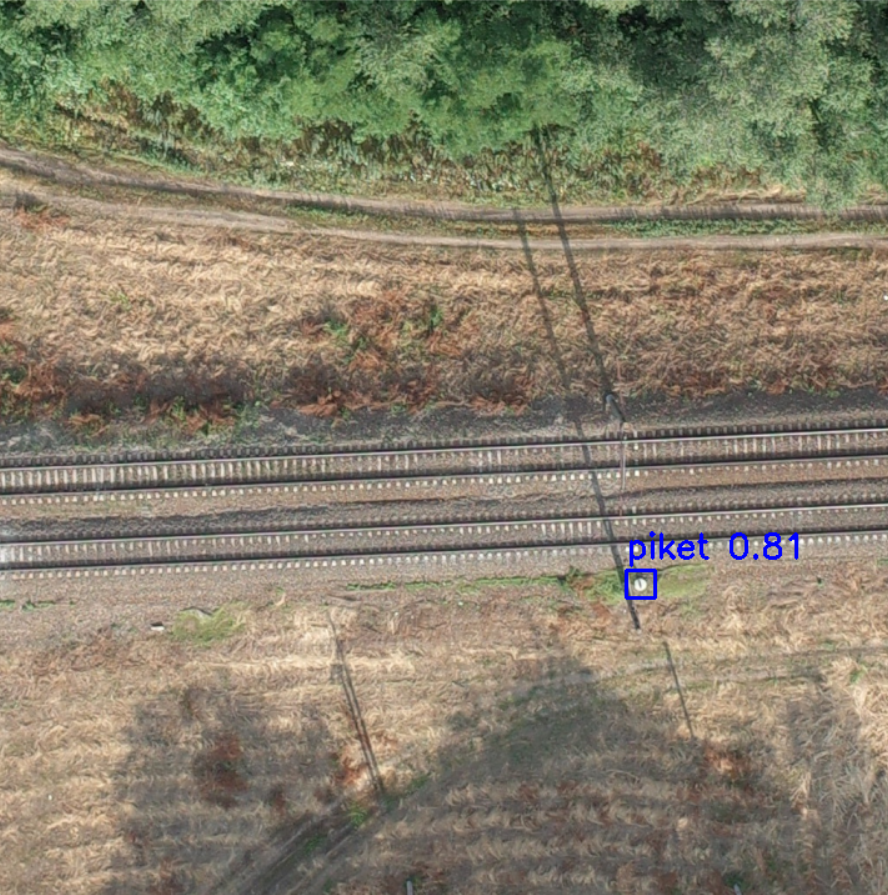